In [1]:
# load libraries
import pandas as pd
import numpy as np
from sklearn import linear_model
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import KFold, train_test_split, GridSearchCV
from scipy import stats
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import shap

import warnings
import os

# suppress all warnings
warnings.filterwarnings('ignore')

# set seed
np.random.seed(42)

# set colours
GradientBlueRed_res = plt.cm.viridis(np.linspace(0, 0.8, 256))
newcmp = ListedColormap(GradientBlueRed_res, name='BlueRed')

Define functions for running models

In [2]:
# function to run linear model
def runLM(X, y, path):

  # create dataframe to store results
  model_df = pd.DataFrame(columns=['Model', 'Fold', 'Spearman', 'Pearson'])

  # initialize the outer folds (5 folds, 80% train, 20% test)
  outer_cv = KFold(n_splits=5, shuffle=True, random_state=42)

  # initialize variables to store best model correlation and features
  best_corr = 0
  best_fold = 0
  best_feat = None

  # loop through each of the outer five folds
  fold = 1
  for train_index, test_index in outer_cv.split(X):

    # split train and test
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # initialize linear regression model
    reg = linear_model.LinearRegression()

    # fit model
    reg.fit(X_train, y_train)

    # get predicted values for test data
    y_pred = reg.predict(X_test)

    # compute correlations
    s_cor = stats.spearmanr(y_pred, y_test)
    p_cor = stats.pearsonr(y_pred, y_test)

    # save model correlation and features (if better than previous)
    if s_cor[0] > best_corr:
            best_corr = s_cor[0]
            best_fold = fold
            best_feat = reg.coef_

    # save results to dataframe
    new_row = pd.DataFrame({'Model': ['Linear'], 'Fold': [fold], 'Spearman': [s_cor[0]], 'Pearson': [p_cor[0]]})
    model_df = pd.concat([model_df, new_row],ignore_index = True)

    # run shap
    explainer = shap.Explainer(reg, X_train)
    shap_values = explainer(X_test)

    # summary plot
    plt.figure()
    shap.summary_plot(shap_values, X_test, show=False)
    for fc in plt.gcf().get_children():
        for fcc in fc.get_children():
            if hasattr(fcc, "set_cmap"):
                fcc.set_cmap(newcmp)
    plt.savefig((path+"/"+str(fold)+"_lm_shap_summary.png"), dpi=300, bbox_inches='tight')

    # heatmap
    plt.figure()
    shap.plots.heatmap(
        shap_values,
        instance_order=shap_values.sum(1),
        show=False
    )
    plt.savefig((path+"/"+str(fold)+"_lm_shap_heatmap.png"), dpi=300, bbox_inches='tight')

    fold += 1

  # print best results
  print("------ Best correlation:", best_corr, "from Fold", best_fold)

  # create feature importance dataframe
  feature_importance = pd.DataFrame({
      'Peak': X_train.columns,
      'Weight': best_feat.flatten()
  }).sort_values(by='Weight', ascending=False)

  # save results to dataframe
  feature_importance.to_csv((path+"/lm_features.csv"), index=False)
  model_df.to_csv((path+"/lm.csv"), index=False)

In [3]:
# function to run LASSO
def runLASSO(X, y, path):

  # create dataframe to store results
  model_df = pd.DataFrame(columns=['Model', 'Fold', 'Spearman', 'Pearson', 'alpha', 'max_iter'])

  # initialize the outer folds (5 folds, 80% train, 20% test)
  outer_cv = KFold(n_splits=5, shuffle=True, random_state=42)

  # initialize variables to store best model correlation and features
  best_corr = 0
  best_fold = 0
  best_feat = None

  # loop through each of the outer five folds
  fold = 1
  for train_index, test_index in outer_cv.split(X):

    # split train and test
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # initialize LASSO model
    lasso = linear_model.Lasso()

    # specify parameters for optimization
    parameters = {
        'alpha': [0.001, 0.01, 0.1, 1, 10, 100],
        'max_iter': [500, 1000, 5000, 7500]
      }

    # identify optimal parameters
    reg = GridSearchCV(
        estimator = lasso,
        param_grid = parameters,
        #verbose=2
      )

    # fit model
    reg.fit(X_train, y_train)

    # get best model parameters
    reg_best = reg.best_estimator_

    alpha = reg.best_params_['alpha']
    max_iter = reg.best_params_['max_iter']

    # get predicted values for test data
    y_pred = reg_best.predict(X_test)

    # compute correlations
    s_cor = stats.spearmanr(y_pred, y_test)
    p_cor = stats.pearsonr(y_pred, y_test.values.ravel())

    # save model correlation and features (if better than previous)
    if s_cor[0] > best_corr:
            best_corr = s_cor[0]
            best_fold = fold
            best_feat = reg_best.coef_

    # save results to dataframe
    new_row = pd.DataFrame({'Model': ['LASSO'], 'Fold': [fold], 'Spearman': [s_cor[0]], 'Pearson': [p_cor[0]],
                            'alpha': [alpha], 'max_iter': [max_iter]})
    model_df = pd.concat([model_df, new_row],ignore_index = True)

    # run shap
    explainer = shap.Explainer(reg_best, X_train)
    shap_values = explainer(X_test)

    # summary plot
    plt.figure()
    shap.summary_plot(shap_values, X_test, show=False)
    for fc in plt.gcf().get_children():
        for fcc in fc.get_children():
            if hasattr(fcc, "set_cmap"):
                fcc.set_cmap(newcmp)
    plt.savefig((path+"/"+str(fold)+"_lasso_shap_summary.png"), dpi=300, bbox_inches='tight')

    # heatmap
    plt.figure()
    shap.plots.heatmap(
        shap_values,
        instance_order=shap_values.sum(1),
        show=False
    )
    plt.savefig((path+"/"+str(fold)+"_lasso_shap_heatmap.png"), dpi=300, bbox_inches='tight')

    fold += 1

  # print results
  print("------ Best correlation:", best_corr, "from Fold", best_fold)

  # create feature importance dataframe
  feature_importance = pd.DataFrame({
      'Peak': X_train.columns,
      'Weight': best_feat
  }).sort_values(by='Weight', ascending=False)

  # save feature importance dataframe
  feature_importance.to_csv((path+"/lasso_features.csv"), index=False)
  model_df.to_csv((path+"/lasso.csv"), index=False)

In [4]:
# function to run elastic net
def runEN(X, y, path):

  # create dataframe to store results
  model_df = pd.DataFrame(columns=['Model', 'Fold', 'Spearman', 'Pearson', 'alpha', 'max_iter'])

  # initialize the outer folds (5 folds, 80% train, 20% test)
  outer_cv = KFold(n_splits=5, shuffle=True, random_state=42)

  # initialize variables to store best model correlation and features
  best_corr = 0
  best_fold = 0
  best_feat = None

  # loop through each of the outer five folds
  fold = 1
  for train_index, test_index in outer_cv.split(X):

    # split train and test
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # initialize ElasticNet model
    en = linear_model.ElasticNet()

    # specify parameters for optimization
    parameters = {
      'alpha': [0.1, 1, 10, 100],
      'l1_ratio': [0.2, 0.5, 0.8],
      'max_iter': [1000, 5000, 7500]
    }

    # identify optimal parameters
    reg = GridSearchCV(
        estimator = en,
        param_grid = parameters,
        #verbose=2
      )

    # fit model
    reg.fit(X_train, y_train)

    # get best model parameters
    reg_best = reg.best_estimator_

    alpha = reg.best_params_['alpha']
    l1_ratio = reg.best_params_['l1_ratio']
    max_iter = reg.best_params_['max_iter']

    # get predicted values for test data
    y_pred = reg_best.predict(X_test)

    # compute correlations
    s_cor = stats.spearmanr(y_pred, y_test)
    p_cor = stats.pearsonr(y_pred, y_test.values.ravel())

    # save model correlation and features (if better than previous)
    if s_cor[0] > best_corr:
            best_corr = s_cor[0]
            best_fold = fold
            best_feat = reg_best.coef_

    # save results to dataframe
    new_row = pd.DataFrame({'Model': ['LASSO'], 'Fold': [fold], 'Spearman': [s_cor[0]], 'Pearson': [p_cor[0]],
                            'alpha': [alpha], 'l1_ratio': [l1_ratio], 'max_iter': [max_iter]})
    model_df = pd.concat([model_df, new_row],ignore_index = True)

    # run shap
    explainer = shap.Explainer(reg_best, X_train)
    shap_values = explainer(X_test)

    # summary plot
    plt.figure()
    shap.summary_plot(shap_values, X_test, show=False)
    for fc in plt.gcf().get_children():
        for fcc in fc.get_children():
            if hasattr(fcc, "set_cmap"):
                fcc.set_cmap(newcmp)
    plt.savefig((path+"/"+str(fold)+"_en_shap_summary.png"), dpi=300, bbox_inches='tight')

    # heatmap
    plt.figure()
    shap.plots.heatmap(
        shap_values,
        instance_order=shap_values.sum(1),
        show=False
    )
    plt.savefig((path+"/"+str(fold)+"_lasso_en_heatmap.png"), dpi=300, bbox_inches='tight')

    fold += 1

  # print results
  print("------ Best correlation:", best_corr, "from Fold", best_fold)

  # create feature importance dataframe
  feature_importance = pd.DataFrame({
      'Peak': X_train.columns,
      'Weight': best_feat
  }).sort_values(by='Weight', ascending=False)

  # save feature importance dataframe
  feature_importance.to_csv((path+"/en_features.csv"), index=False)
  model_df.to_csv((path+"/en.csv"), index=False)

In [5]:
# run models for each dataset pair
def runModels(df, pair, outdir):

  # specify column names
  var = {"gcsi_ccle": ["gdsc_median", "gcsi_ccle_spearman"],
        "gcsi_gdsc": ["ccle_median", "gcsi_gdsc_spearman"],
        "gdsc_ccle": ["gcsi_median", "gdsc_ccle_spearman"]}

  # get needed columns and remove NA
  #chr_cols = [f"chr{i}" for i in range(1, 23)] + ["chrX", "chrY", "chrM"]
  #available_cols = [c for c in [var[pair][0], var[pair][1], "gc", "n_exon", "length", *chr_cols] if c in df.columns]
  #subset = df[available_cols].dropna()
  subset = df[[var[pair][0], var[pair][1], "gc", "n_exon", "length"]].dropna()

  # get X and y
  X = subset.drop(columns=[var[pair][1]]).rename(
    columns={
        var[pair][0]: "Median exp",
        "gc": "GC%",
        "n_exon": "No. Exons",
        "length": "Transcript Length",
    }
  )
  y = subset[[var[pair][1]]]

  # create folder to store results
  path = os.path.join(outdir, pair)
  os.makedirs(path, exist_ok=True)

  # run models
  print("--- running LM for " + pair)
  runLM(X, y, path)

  print("--- running LASSO for " + pair)
  runLASSO(X, y, path)

  print("--- running EN for " + pair)
  runEN(X, y, path)


In [6]:
# function to run models for each dataset
def runAllPairs(df, outdir):

  # load in dataset
  df = pd.read_csv(df)

  # run models
  print("\nStarting gCSI/CCLE:")
  runModels(df, "gcsi_ccle", outdir)

  print("\nStarting gCSI/GDSC:")
  runModels(df, "gcsi_gdsc", outdir)

  print("\nStarting GDSC/CCLE:")
  runModels(df, "gdsc_ccle", outdir)

Run models for each pipeline


Starting gCSI/CCLE:
--- running LM for gcsi_ccle
------ Best correlation: 0.1555690574797088 from Fold 5
--- running LASSO for gcsi_ccle
------ Best correlation: 0.22428912363811845 from Fold 4
--- running EN for gcsi_ccle
------ Best correlation: 0.22428912363811845 from Fold 4

Starting gCSI/GDSC:
--- running LM for gcsi_gdsc
------ Best correlation: 0.26174780670624737 from Fold 3
--- running LASSO for gcsi_gdsc
------ Best correlation: 0.18052975262476517 from Fold 4
--- running EN for gcsi_gdsc
------ Best correlation: 0.18052975262476517 from Fold 4

Starting GDSC/CCLE:
--- running LM for gdsc_ccle
------ Best correlation: 0.23411142633235357 from Fold 5
--- running LASSO for gdsc_ccle
------ Best correlation: 0.23436980252882988 from Fold 5
--- running EN for gdsc_ccle
------ Best correlation: 0.2350592954747536 from Fold 5


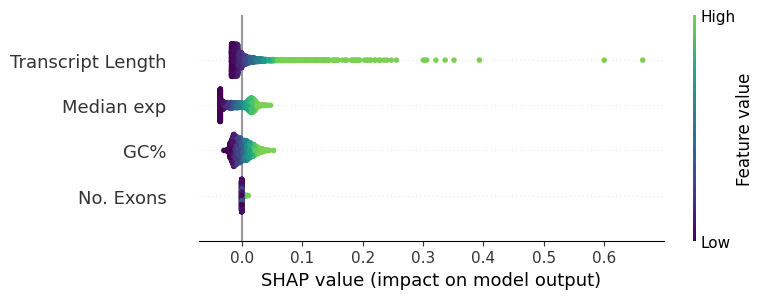

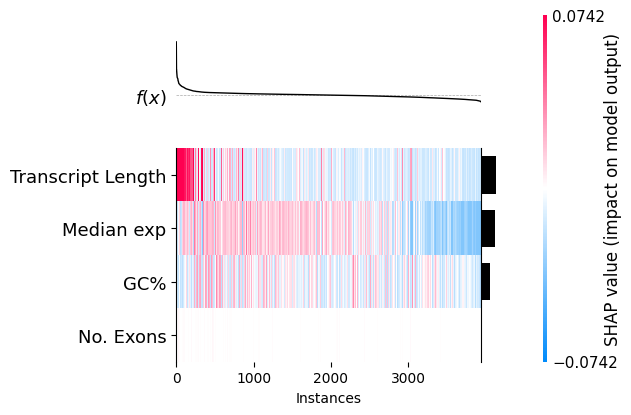

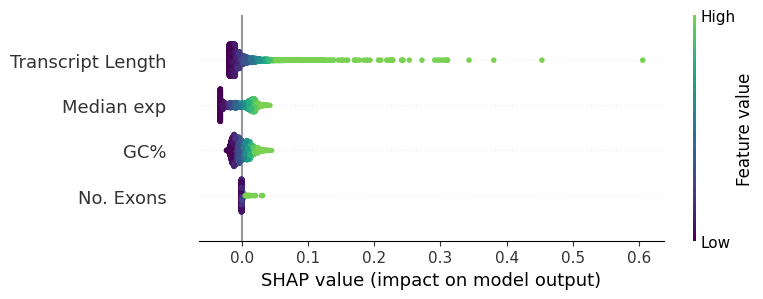

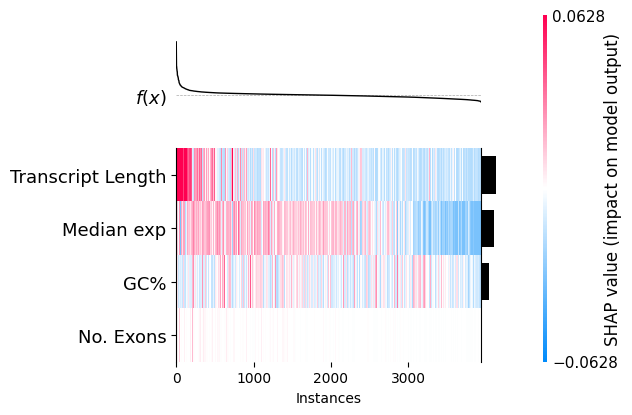

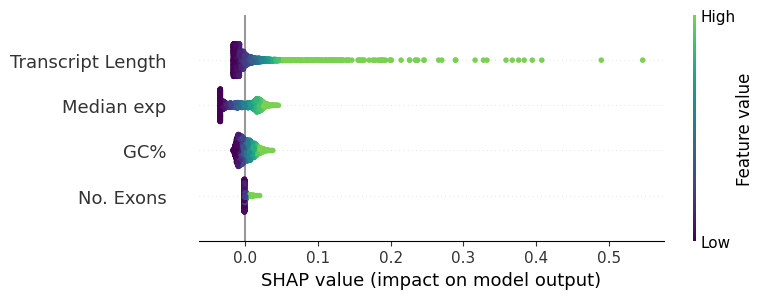

...

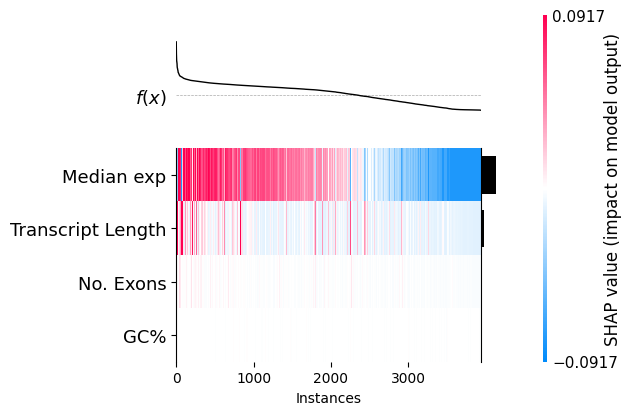

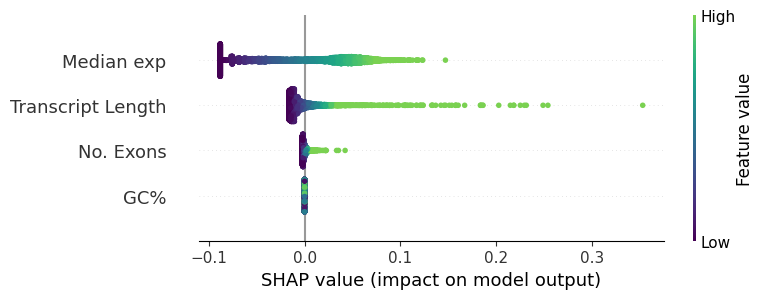

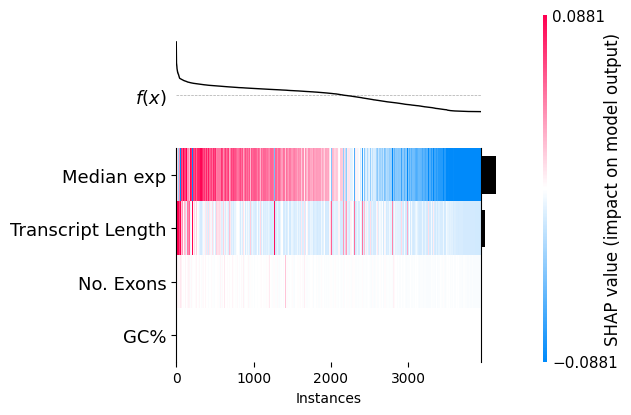

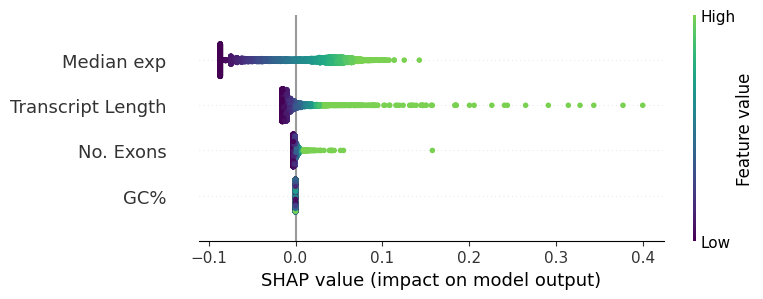

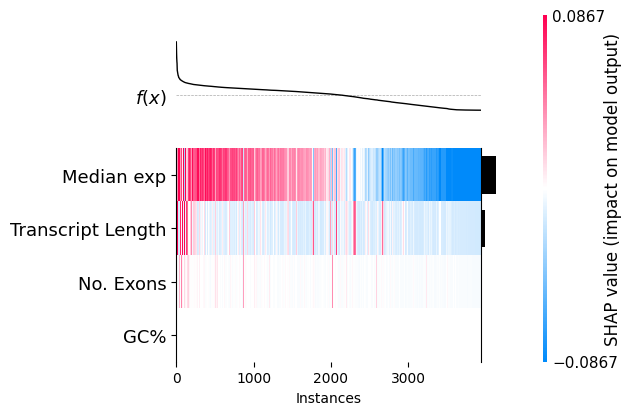

In [7]:
runAllPairs("gene_stability.csv", "Gene_Expression")


Starting gCSI/CCLE:
--- running LM for gcsi_ccle
------ Best correlation: 0.32932286804954286 from Fold 4
--- running LASSO for gcsi_ccle
------ Best correlation: 0.3295279702825283 from Fold 4
--- running EN for gcsi_ccle
------ Best correlation: 0.3333772007473037 from Fold 4

Starting gCSI/GDSC:
--- running LM for gcsi_gdsc
------ Best correlation: 0.27667257024767433 from Fold 4
--- running LASSO for gcsi_gdsc
------ Best correlation: 0.27702433995214876 from Fold 4
--- running EN for gcsi_gdsc
------ Best correlation: 0.2836902785199641 from Fold 4

Starting GDSC/CCLE:
--- running LM for gdsc_ccle
------ Best correlation: 0.41338472573643154 from Fold 4
--- running LASSO for gdsc_ccle
------ Best correlation: 0.41348680572774044 from Fold 4
--- running EN for gdsc_ccle
------ Best correlation: 0.41551124513537835 from Fold 4


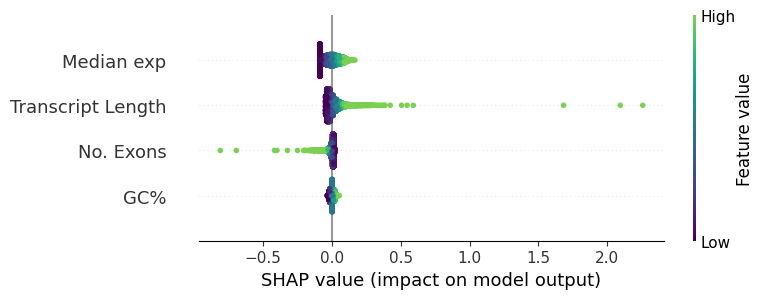

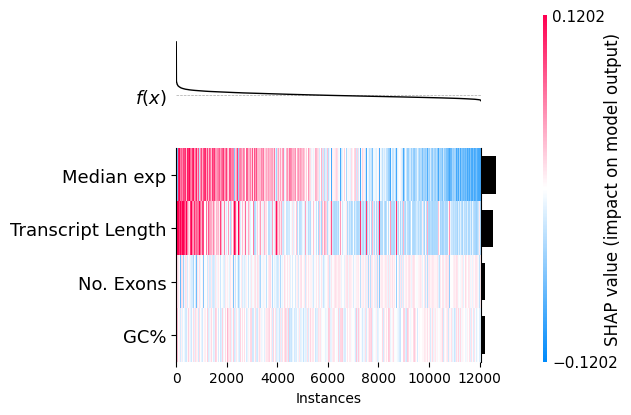

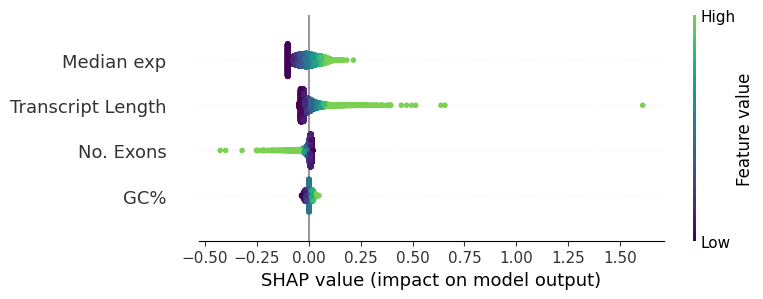

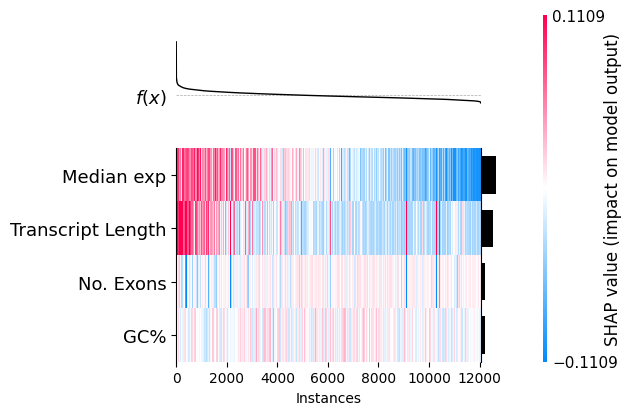

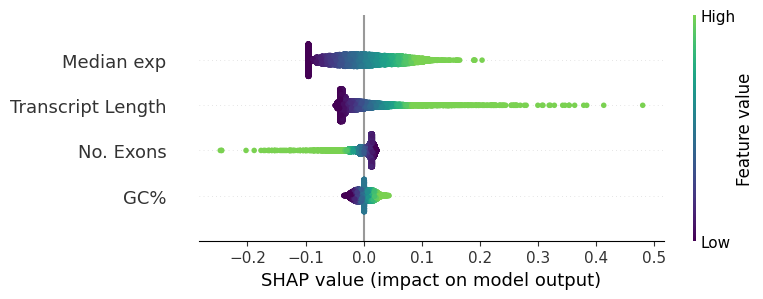

...

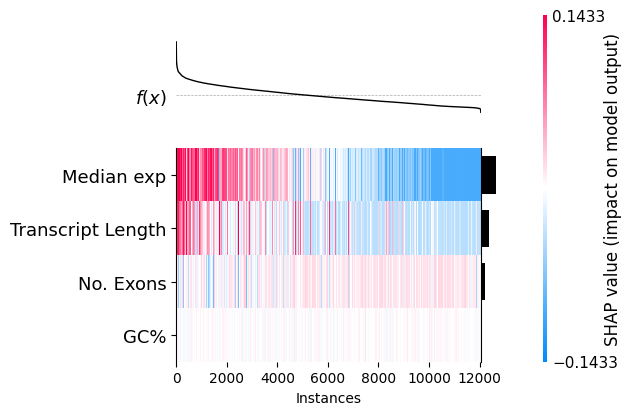

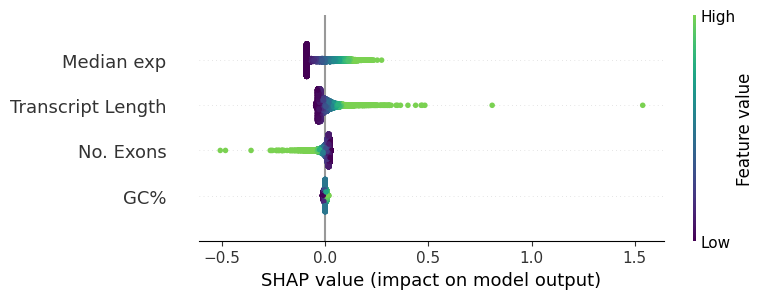

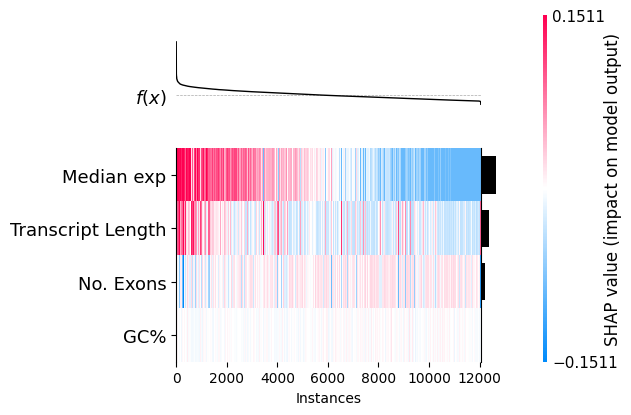

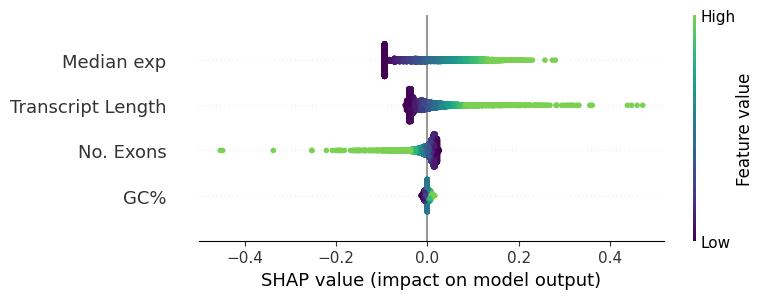

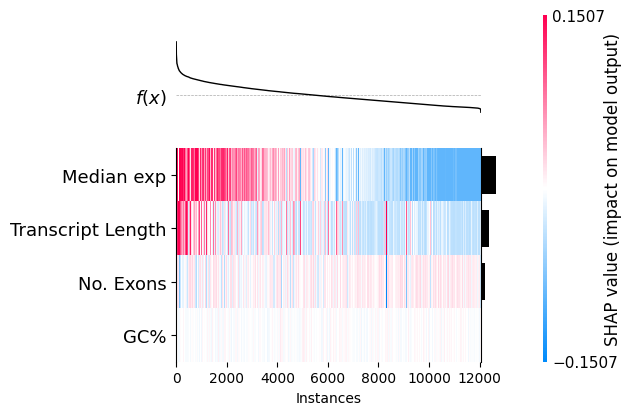

In [8]:
runAllPairs("transcript_stability.csv", "Isoform_Expression")


Starting gCSI/CCLE:
--- running LM for gcsi_ccle
------ Best correlation: 0.12264864269617226 from Fold 3
--- running LASSO for gcsi_ccle
------ Best correlation: 0.1605967684221346 from Fold 4
--- running EN for gcsi_ccle
------ Best correlation: 0.1605967684221346 from Fold 4

Starting gCSI/GDSC:
--- running LM for gcsi_gdsc
------ Best correlation: 0.38181818181818183 from Fold 4
--- running LASSO for gcsi_gdsc
------ Best correlation: 0.5757575757575757 from Fold 4
--- running EN for gcsi_gdsc
------ Best correlation: 0.5757575757575757 from Fold 4

Starting GDSC/CCLE:
--- running LM for gdsc_ccle
------ Best correlation: 0.21757512627648798 from Fold 3
--- running LASSO for gdsc_ccle
------ Best correlation: 0.22424242424242422 from Fold 2
--- running EN for gdsc_ccle
------ Best correlation: 0.22424242424242422 from Fold 2


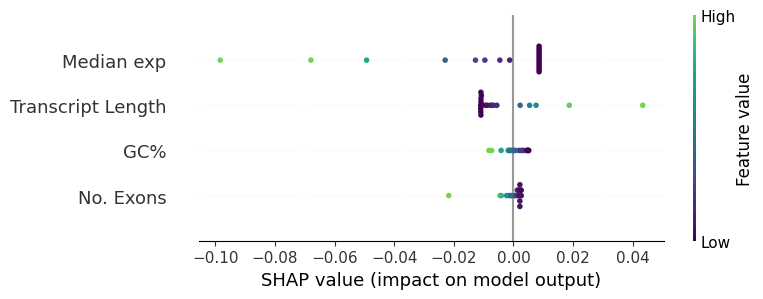

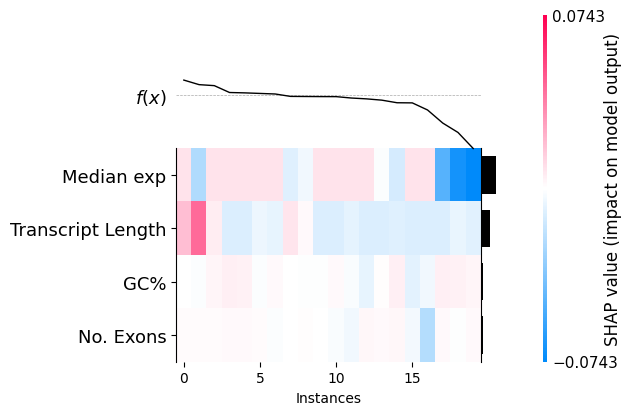

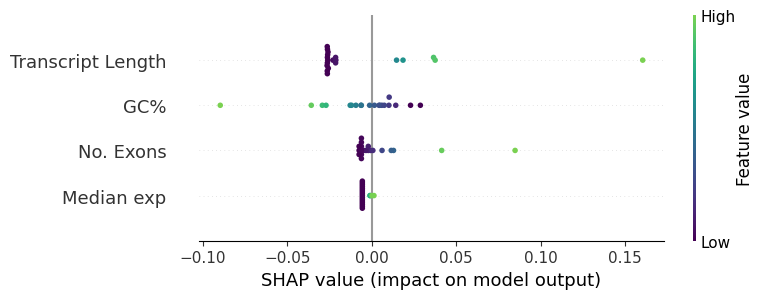

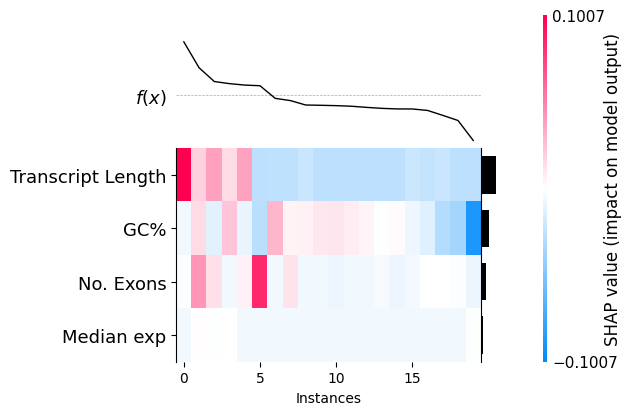

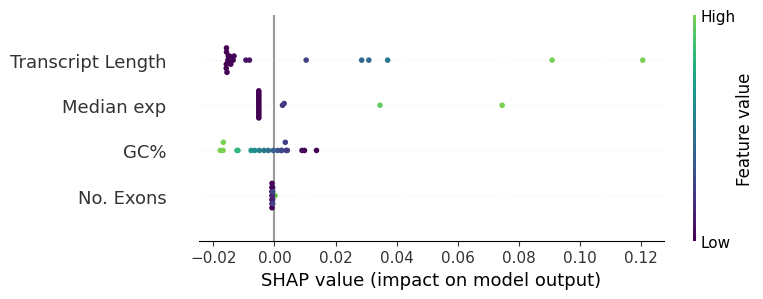

...

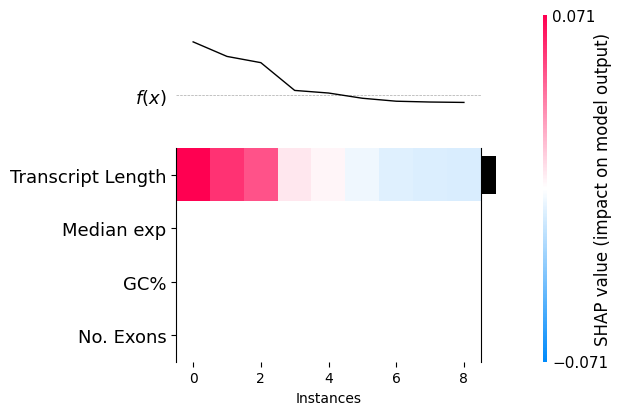

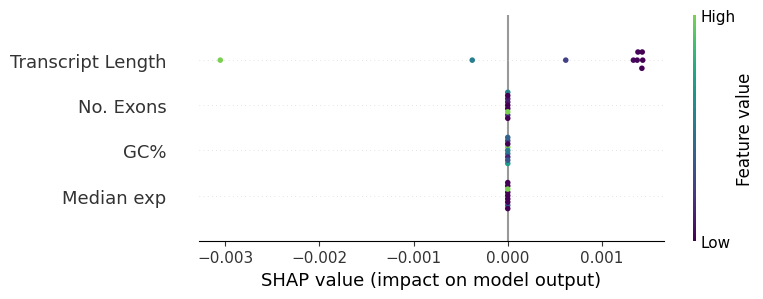

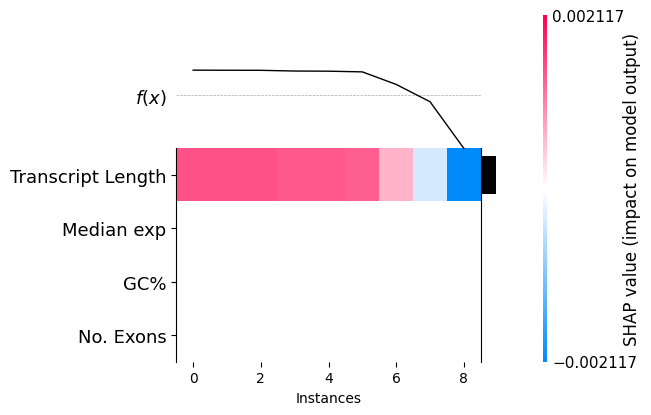

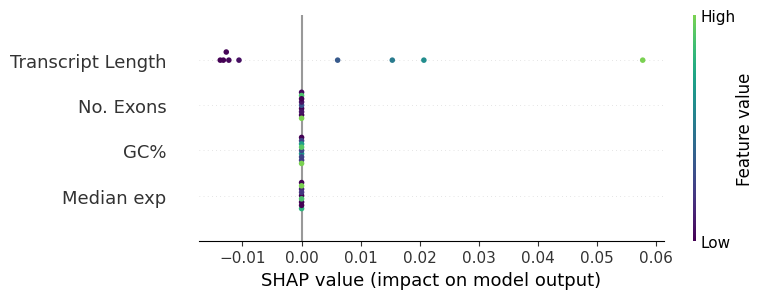

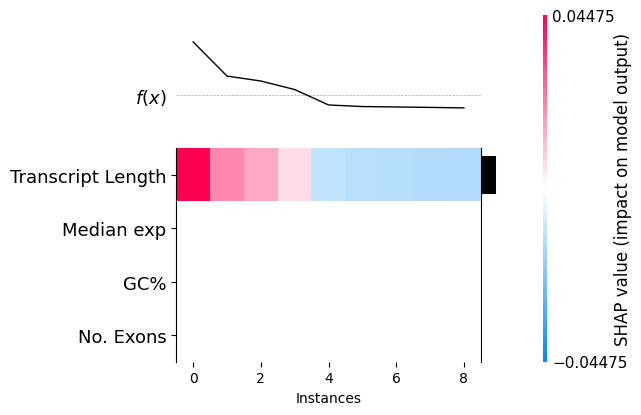

In [9]:

runAllPairs("ciri_stability.csv", "CIRI2")


Starting gCSI/CCLE:
--- running LM for gcsi_ccle
------ Best correlation: 0.180458023679647 from Fold 2
--- running LASSO for gcsi_ccle
------ Best correlation: 0.37645082467929136 from Fold 2
--- running EN for gcsi_ccle
------ Best correlation: 0.37645082467929136 from Fold 2

Starting gCSI/GDSC:
--- running LM for gcsi_gdsc
------ Best correlation: 0.30882995527018386 from Fold 1
--- running LASSO for gcsi_gdsc
------ Best correlation: 0.305905618431955 from Fold 5
--- running EN for gcsi_gdsc
------ Best correlation: 0.2935507873159633 from Fold 5

Starting GDSC/CCLE:
--- running LM for gdsc_ccle
------ Best correlation: 0.02941176470588235 from Fold 5
--- running LASSO for gdsc_ccle
------ Best correlation: 0 from Fold 0
--- running EN for gdsc_ccle
------ Best correlation: 0 from Fold 0


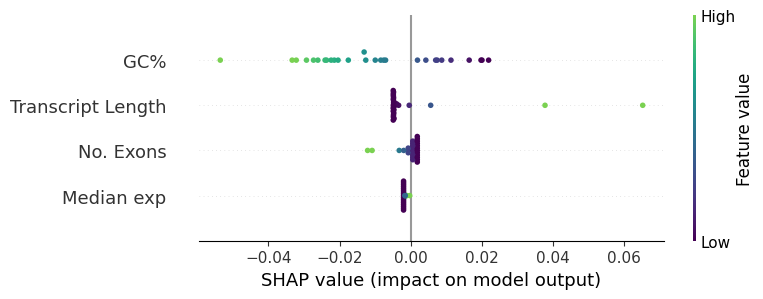

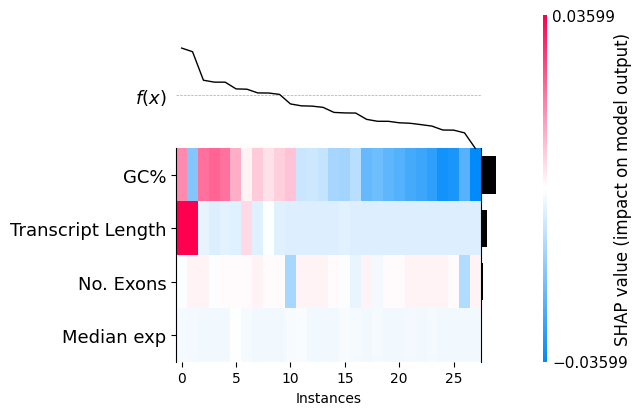

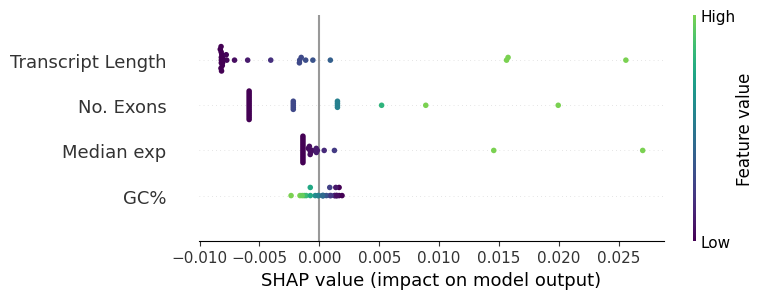

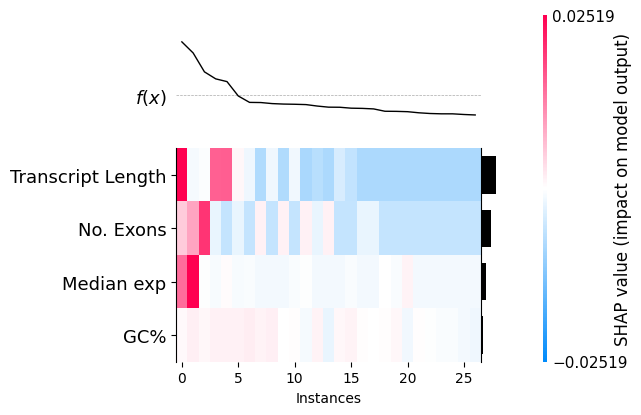

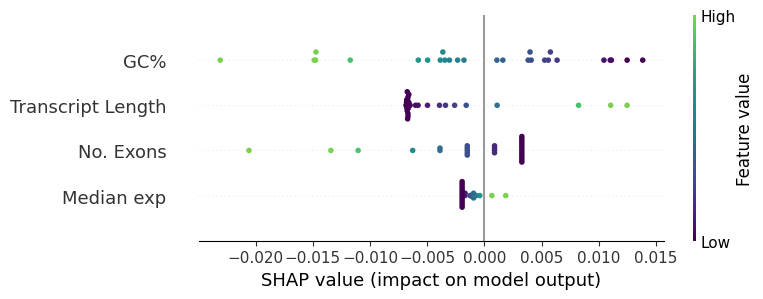

...

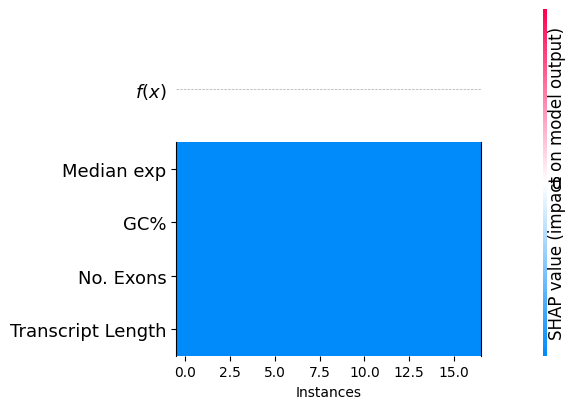

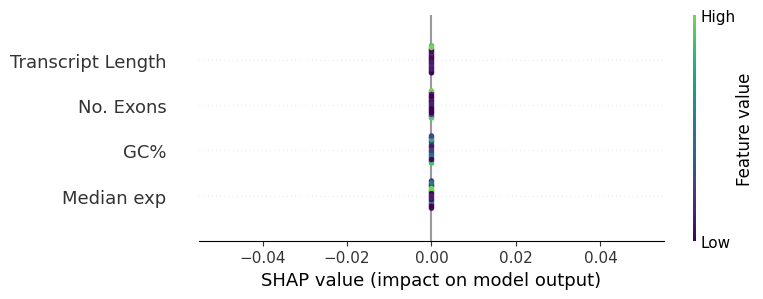

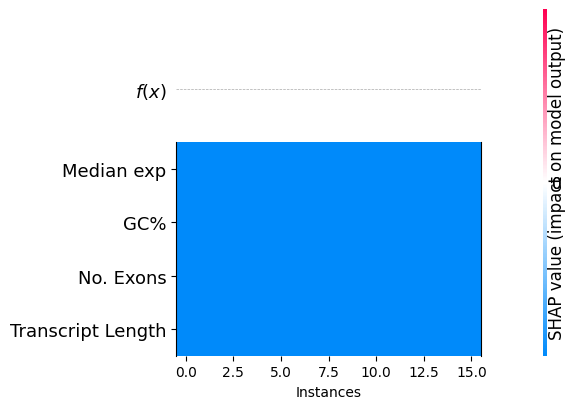

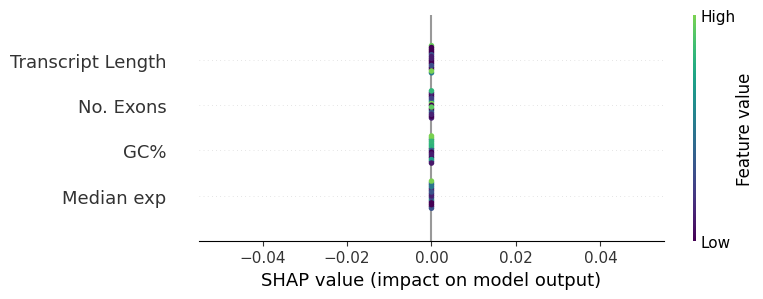

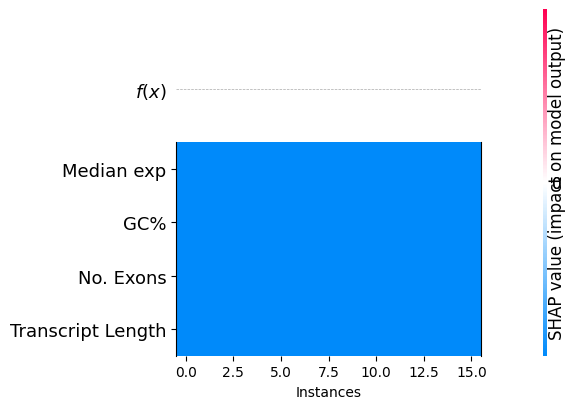

In [10]:
runAllPairs("circ_stability.csv", "CIRCexplorer2")


Starting gCSI/CCLE:
--- running LM for gcsi_ccle
------ Best correlation: 0.29073217434513365 from Fold 4
--- running LASSO for gcsi_ccle
------ Best correlation: 0.22212099711589933 from Fold 5
--- running EN for gcsi_ccle
------ Best correlation: 0.226634266877877 from Fold 5

Starting gCSI/GDSC:
--- running LM for gcsi_gdsc
------ Best correlation: 0.4159887773536933 from Fold 5
--- running LASSO for gcsi_gdsc
------ Best correlation: 0.3635352096747466 from Fold 3
--- running EN for gcsi_gdsc
------ Best correlation: 0.277796370225091 from Fold 3

Starting GDSC/CCLE:
--- running LM for gdsc_ccle
------ Best correlation: 0.38909909560510225 from Fold 3
--- running LASSO for gdsc_ccle
------ Best correlation: 0.45565367623615144 from Fold 3
--- running EN for gdsc_ccle
------ Best correlation: 0.45565367623615144 from Fold 3


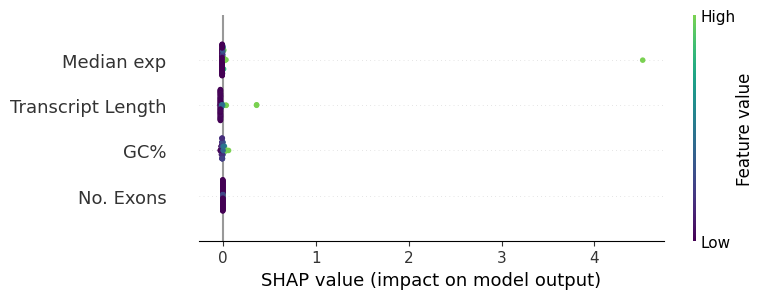

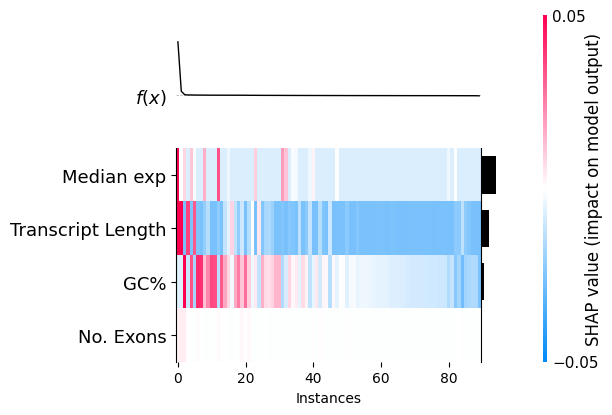

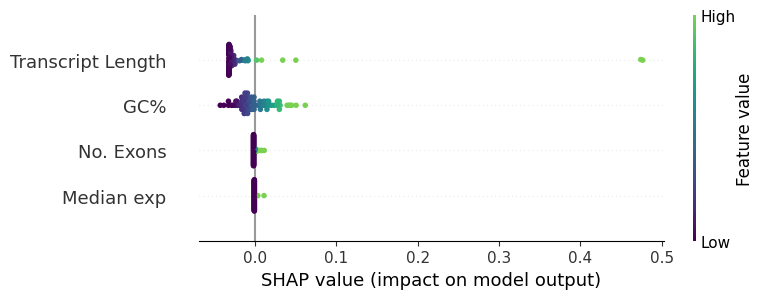

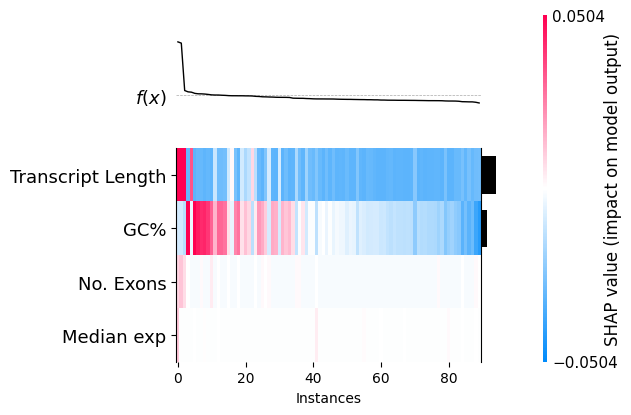

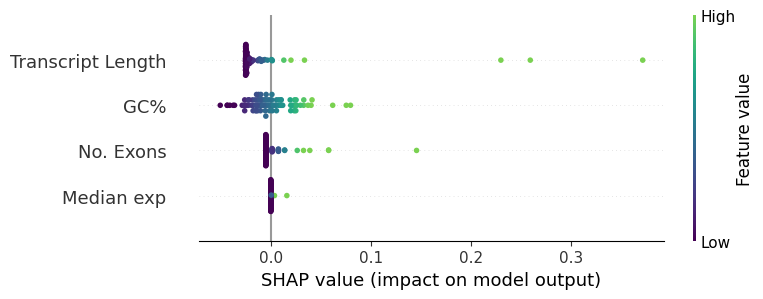

...

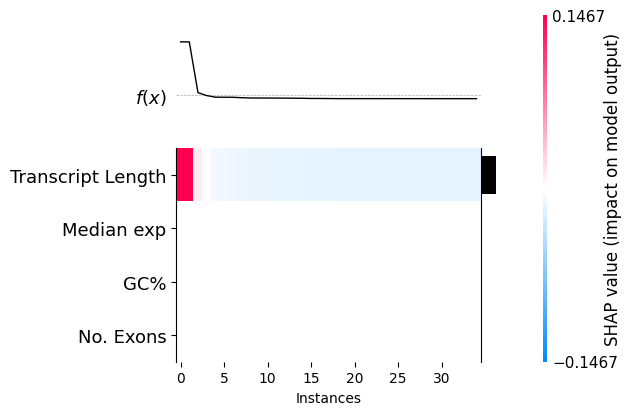

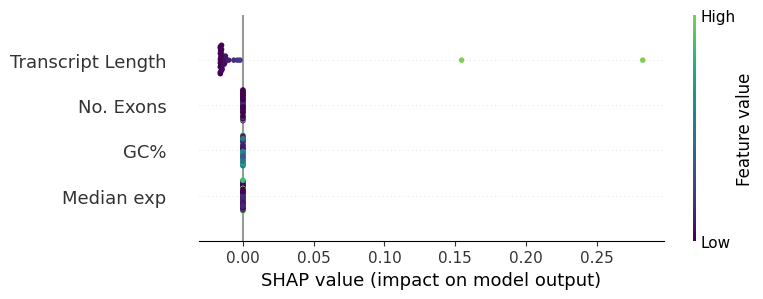

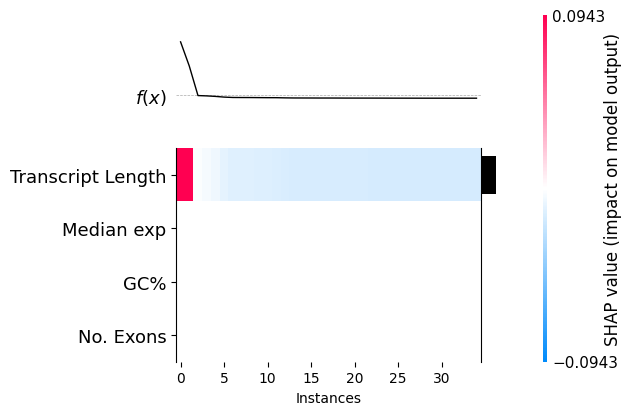

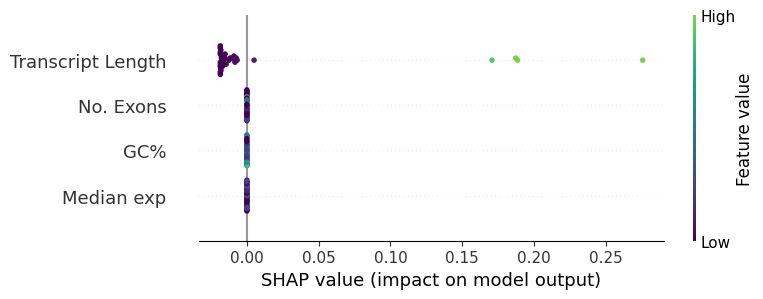

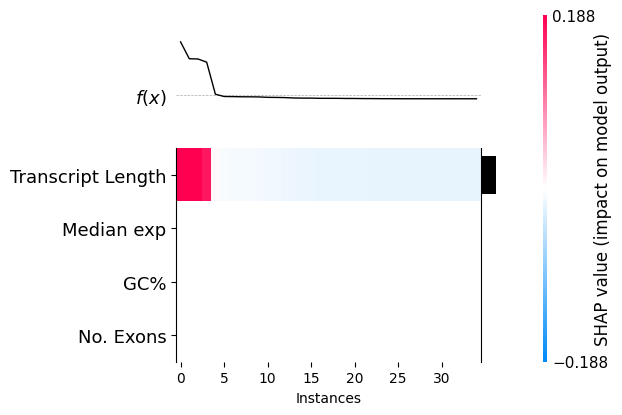

In [11]:
runAllPairs("cfnd_stability.csv", "circRNA_finder")


Starting gCSI/CCLE:
--- running LM for gcsi_ccle
------ Best correlation: 0.2401407472854148 from Fold 4
--- running LASSO for gcsi_ccle
------ Best correlation: 0.2203166509877976 from Fold 1
--- running EN for gcsi_ccle
------ Best correlation: 0.2203166509877976 from Fold 1

Starting gCSI/GDSC:
--- running LM for gcsi_gdsc
------ Best correlation: 0.2086409288980511 from Fold 1
--- running LASSO for gcsi_gdsc
------ Best correlation: 0.30357999614732184 from Fold 3
--- running EN for gcsi_gdsc
------ Best correlation: 0.30357999614732184 from Fold 3

Starting GDSC/CCLE:
--- running LM for gdsc_ccle
------ Best correlation: 0.41048868290137236 from Fold 4
--- running LASSO for gdsc_ccle
------ Best correlation: 0.40548737334101925 from Fold 4
--- running EN for gdsc_ccle
------ Best correlation: 0.3879002538134608 from Fold 4


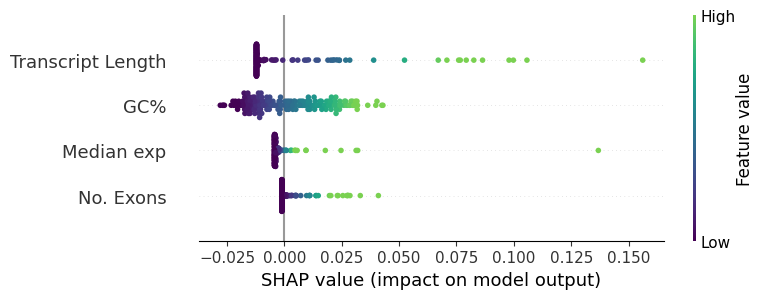

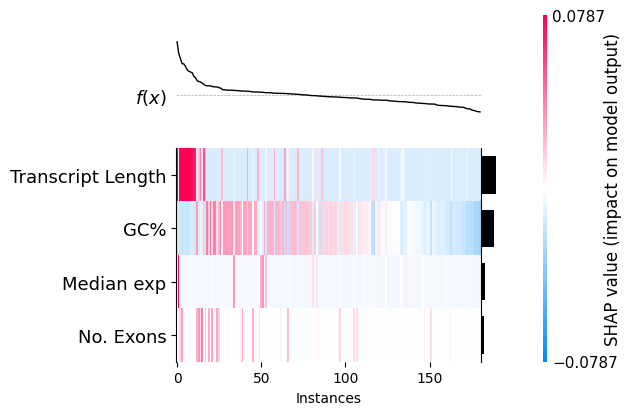

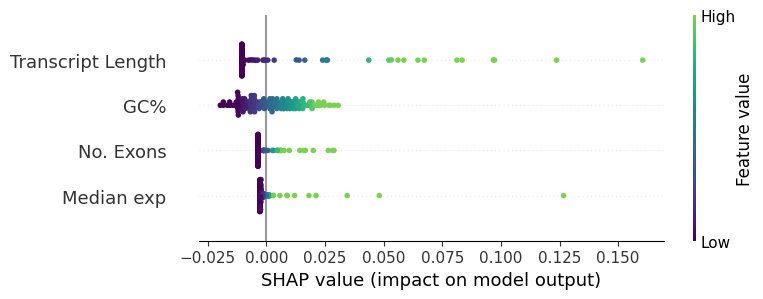

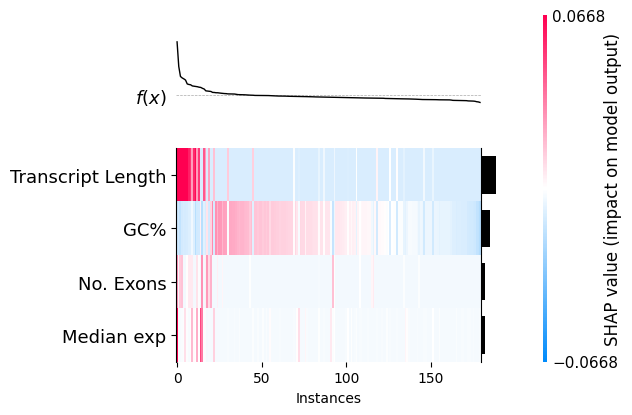

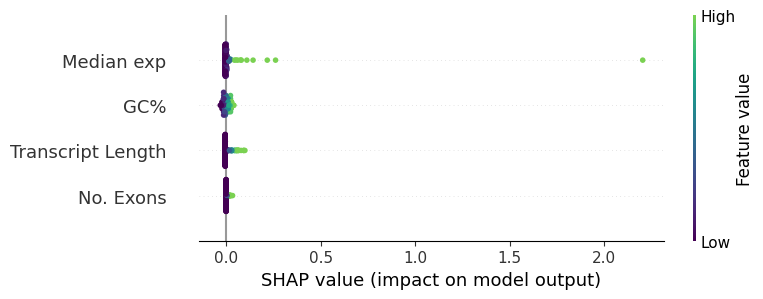

...

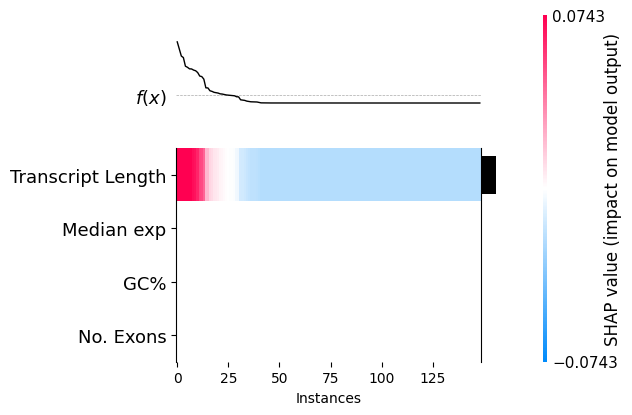

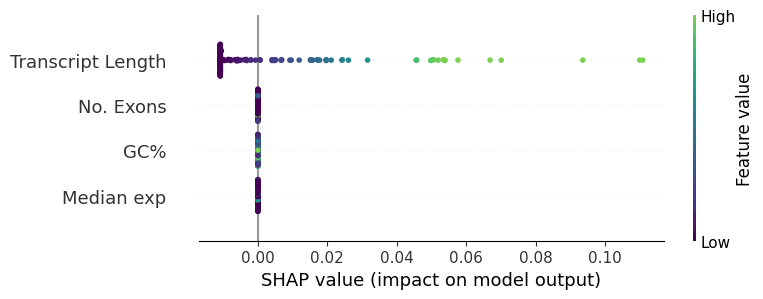

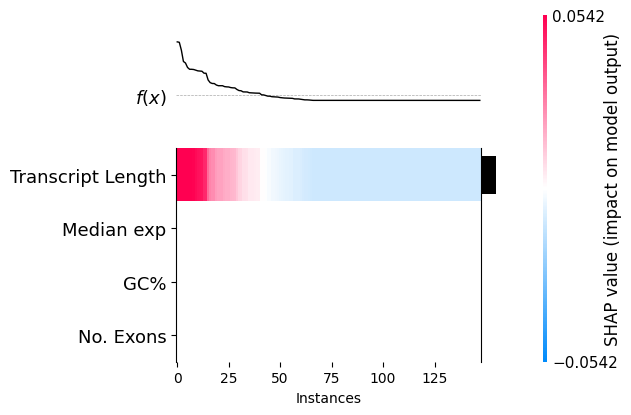

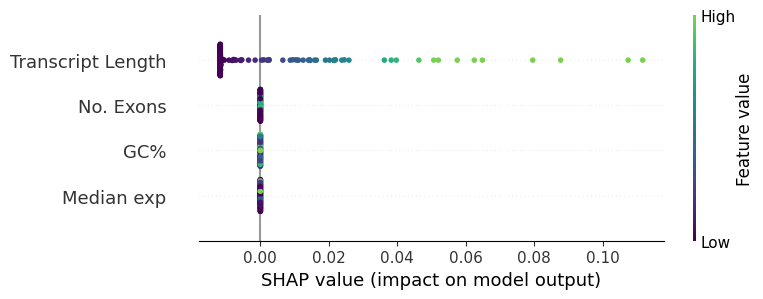

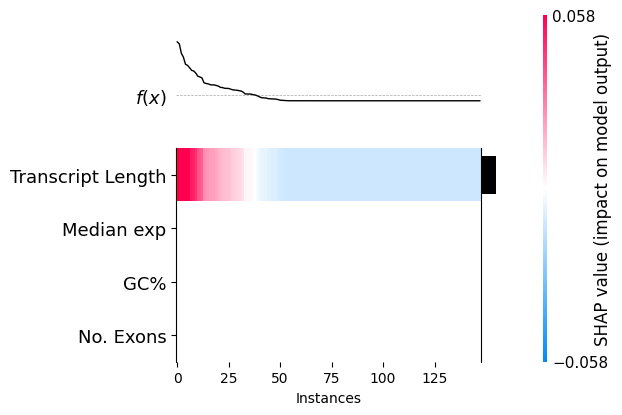

In [12]:
runAllPairs("fcrc_stability.csv", "find_circ")

In [13]:
!zip -r Gene_Expression.zip "Gene_Expression"

  adding: Gene_Expression/ (stored 0%)
  adding: Gene_Expression/gcsi_ccle/ (stored 0%)
  adding: Gene_Expression/gcsi_ccle/3_lm_shap_summary.png (deflated 12%)
  adding: Gene_Expression/gcsi_ccle/5_lasso_shap_heatmap.png (deflated 20%)
  adding: Gene_Expression/gcsi_ccle/2_lm_shap_heatmap.png (deflated 18%)
  adding: Gene_Expression/gcsi_ccle/1_lm_shap_summary.png (deflated 12%)
  adding: Gene_Expression/gcsi_ccle/3_lasso_shap_summary.png (deflated 13%)
  adding: Gene_Expression/gcsi_ccle/1_lm_shap_heatmap.png (deflated 18%)
  adding: Gene_Expression/gcsi_ccle/3_lm_shap_heatmap.png (deflated 18%)
  adding: Gene_Expression/gcsi_ccle/2_lasso_en_heatmap.png (deflated 20%)
  adding: Gene_Expression/gcsi_ccle/2_lm_shap_summary.png (deflated 12%)
  adding: Gene_Expression/gcsi_ccle/3_lasso_shap_heatmap.png (deflated 19%)
  adding: Gene_Expression/gcsi_ccle/2_lasso_shap_heatmap.png (deflated 20%)
  adding: Gene_Expression/gcsi_ccle/lasso.csv (deflated 41%)
  adding: Gene_Expression/gcsi_ccle

In [14]:
!zip -r Isoform_Expression.zip "Isoform_Expression"
!zip -r CIRI2.zip "CIRI2"
!zip -r CIRCexplorer2.zip "CIRCexplorer2"
!zip -r circRNA_finder.zip "circRNA_finder"
!zip -r find_circ.zip "find_circ"

  adding: Isoform_Expression/ (stored 0%)
  adding: Isoform_Expression/gcsi_ccle/ (stored 0%)
  adding: Isoform_Expression/gcsi_ccle/3_lm_shap_summary.png (deflated 10%)
  adding: Isoform_Expression/gcsi_ccle/5_lasso_shap_heatmap.png (deflated 17%)
  adding: Isoform_Expression/gcsi_ccle/2_lm_shap_heatmap.png (deflated 18%)
  adding: Isoform_Expression/gcsi_ccle/1_lm_shap_summary.png (deflated 12%)
  adding: Isoform_Expression/gcsi_ccle/3_lasso_shap_summary.png (deflated 10%)
  adding: Isoform_Expression/gcsi_ccle/1_lm_shap_heatmap.png (deflated 18%)
  adding: Isoform_Expression/gcsi_ccle/3_lm_shap_heatmap.png (deflated 17%)
  adding: Isoform_Expression/gcsi_ccle/2_lasso_en_heatmap.png (deflated 18%)
  adding: Isoform_Expression/gcsi_ccle/2_lm_shap_summary.png (deflated 12%)
  adding: Isoform_Expression/gcsi_ccle/3_lasso_shap_heatmap.png (deflated 17%)
  adding: Isoform_Expression/gcsi_ccle/2_lasso_shap_heatmap.png (deflated 17%)
  adding: Isoform_Expression/gcsi_ccle/lasso.csv (deflate